
#  <span style="font-family:Playfair Display"> <span style="color:white;display:fill;border-radius:8px;background-color:#0B2F46;font-size:100%;font-weight: bold;color: #dbba78;font-style: italic;">our goal : training model using grayscale images as inputs, where the goal is to learn how to convert these grayscale images back to their colored version </span><a id="2"></a>

<a id="1"></a>
# <center> <span style="font-family:Georgia"> <span style="color:white;font-weight:bold"> <span style="background:#0B2F46"> 📕Image Colorization</span>
    

#  <span style="font-family:Playfair Display"> <span style="color:white;display:fill;border-radius:8px;background-color:#0B2F46;font-size:100%;font-weight: bold;color: #dbba78;font-style: italic;">Import Libarariesㅤ</span><a id="2"></a>

In [1]:
import matplotlib.pyplot as plt
import numpy as np
from glob import glob
import time
import tensorflow as tf
from tensorflow import keras
from keras import Sequential
from keras.layers import Conv2D, Input, MaxPool2D, Conv2DTranspose, concatenate, Lambda, BatchNormalization, Activation, LeakyReLU, ReLU,Dropout
from keras.utils import img_to_array, load_img, plot_model
from keras.optimizers import Adam
from keras.initializers import RandomNormal
import warnings
from tensorflow.keras.models import Model
warnings.filterwarnings("ignore")


#  <span style="font-family:Playfair Display"> <span style="color:white;display:fill;border-radius:8px;background-color:#0B2F46;font-size:100%;font-weight: bold;color: #dbba78;font-style: italic;">Read images & Load imagesㅤ</span><a id="2"></a>

In [2]:
images = '../input/landscape-image-colorization/landscape Images/'

# <span style="font-family:Playfair Display"> <span style="color:white;display:fill;border-radius:8px;background-color:#0B2F46;font-size:100%;font-weight: bold;color: #dbba78;font-style: italic;">🎨 Image Colorization Dataset Preparation ㅤ</span><a id="2"></a>
-  Sorting the first 1000 Grayscale images and their corresponding Color images


In [3]:
color_img = sorted(glob(images + "color/*.jpg"))[:1000]
gray_img = sorted(glob(images + "gray/*.jpg"))[:1000]

In [4]:
image_shape = (256, 256, 3)
images = np.zeros((len(color_img), *image_shape), dtype=np.float32)
masks = np.zeros((len(gray_img), *image_shape), dtype=np.float32)

In [5]:
for i in range(1000):
    color_image = load_img(color_img[i], target_size=(256, 256))
    images[i] = img_to_array(color_image) / 255.0

    gray_image = load_img(gray_img[i], target_size=(256, 256))
    masks[i] = img_to_array(gray_image) / 255.0

# <span style="font-family:Playfair Display"> <span style="color:white;display:fill;border-radius:8px;background-color:#0B2F46;font-size:100%;font-weight: bold;color: #dbba78;font-style: italic;">🎨 Plot RGB images and their corresponding grayscale masks</span><a id="2"></a>

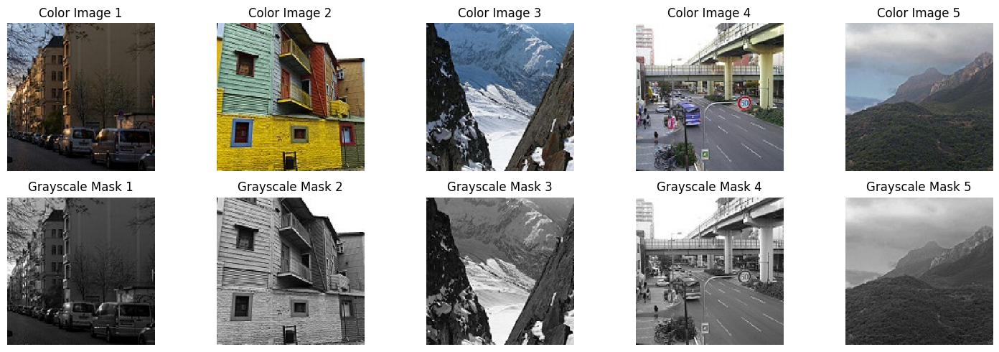

In [6]:
num_images_to_display = 5  

plt.figure(figsize=(15, 5))

for i in range(num_images_to_display):
    # Plot RGB images
    plt.subplot(2, num_images_to_display, i + 1)
    plt.imshow(images[i])  
    plt.title(f'Color Image {i + 1}')
    plt.axis('off')

    # Plot grayscale masks
    plt.subplot(2, num_images_to_display, i + 1 + num_images_to_display)
    plt.imshow(masks[i])  
    plt.title(f'Grayscale Mask {i + 1}')
    plt.axis('off')

plt.tight_layout()
plt.show()


 # <span style="font-family:Playfair Display"> <span style="color:white;display:fill;border-radius:8px;background-color:#0B2F46;font-size:100%;font-weight: bold;color: #dbba78;font-style: italic;">downscaling and upscaling functions</span><a id="2"></a>

 - **Downscaling Layers: allows the model to extract essential features**
 -  **Upsampling for Reconstruction
     Upscaling Layers: After feature extraction, upsampling layers help reconstruct the image back to its original resolution**
     

In [7]:
''''def downscale(num_filters):
    block = Sequential()
    block.add(Conv2D(num_filters, kernel_size=4, strides=2, padding='same', 
                     kernel_initializer='he_normal', use_bias=False))
    block.add(LeakyReLU(negative_slope=0.2))
    block.add(BatchNormalization())
    block.add(Dropout(0.3)) 
    return block

def upscale(num_filters):
    block = Sequential()
    block.add(Conv2DTranspose(num_filters, kernel_size=4, strides=2, padding='same', 
                               kernel_initializer='he_normal', use_bias=False))
    block.add(ReLU())  
    block.add(BatchNormalization())
    block.add(Dropout(0.3))
    return block'''

"'def downscale(num_filters):\n    block = Sequential()\n    block.add(Conv2D(num_filters, kernel_size=4, strides=2, padding='same', \n                     kernel_initializer='he_normal', use_bias=False))\n    block.add(LeakyReLU(negative_slope=0.2))\n    block.add(BatchNormalization())\n    block.add(Dropout(0.3)) \n    return block\n\ndef upscale(num_filters):\n    block = Sequential()\n    block.add(Conv2DTranspose(num_filters, kernel_size=4, strides=2, padding='same', \n                               kernel_initializer='he_normal', use_bias=False))\n    block.add(ReLU())  \n    block.add(BatchNormalization())\n    block.add(Dropout(0.3))\n    return block"

###################

In [8]:
def downscale(num_filters):
    block = Sequential()
    block.add(Conv2D(num_filters, kernel_size=4, strides=2, padding='same', kernel_initializer='he_normal', use_bias=False))
    block.add(LeakyReLU(negative_slope=0.2))
    block.add(BatchNormalization())
    return block

def upscale(num_filters):
    block = Sequential()
    block.add(Conv2DTranspose(num_filters, kernel_size=4, strides=2, padding='same', kernel_initializer='he_normal', use_bias=False))
    block.add(LeakyReLU(negative_slope=0.2))
    block.add(BatchNormalization())
    block.add(ReLU())
    return block

#################

 # <span style="font-family:Playfair Display"> <span style="color:white;display:fill;border-radius:8px;background-color:#0B2F46;font-size:100%;font-weight: bold;color: #dbba78;font-style: italic;">Generator</span><a id="2"></a>

In [9]:
def Generator():
    inputs = Input(shape=(256, 256, 3), name="InputLayer")

    encoder = [
        downscale(64),
        downscale(128),
        downscale(256),
        downscale(512),
        downscale(512),
        downscale(512),
        downscale(512),
    ]
    
    latent_space = downscale(512)

    decoder = [
        upscale(512),
        upscale(512),
        upscale(512),
        upscale(512),
        upscale(256),
        upscale(128),
        upscale(64),
    ]
    
    x = inputs 
    skips = []
    
    # Encoder: Downscaling
    for layer in encoder:
        x = layer(x)
        skips.append(x)
    
    # Latent Space
    x = latent_space(x)

    skips = reversed(skips)
    
    # Decoder: Upscaling
    for up, skip in zip(decoder, skips):
        x = up(x)
        x = concatenate([x, skip])
    
    initializer = RandomNormal(stddev=0.02, seed=42)
    outputs = Conv2DTranspose(3, kernel_size=4, strides=2, kernel_initializer=initializer, activation='tanh', padding='same')

    outputs = outputs(x)

    generator = Model(inputs=inputs, outputs=outputs, name="Generator")
    return generator
generator = Generator()

In [10]:
generator.summary()

Model: "Generator"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ InputLayer          │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential          │ (None, 128, 128,  │      3,328 │ InputLayer[0][0]  │
│ (Sequential)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_1        │ (None, 64, 64,    │    131,584 │ sequential[0][0]  │
│ (Sequential)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_2        │ (None, 32, 32,    │    525,312 │ sequential_1[0][… │
│ (Sequential)        │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_3        │ (None, 16, 16,    │  2,099,200 │ sequential_2[0][… │
│ (Sequential)        │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_4        │ (None, 8, 8, 512) │  4,196,352 │ sequential_3[0][… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_5        │ (None, 4, 4, 512) │  4,196,352 │ sequential_4[0][… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_6        │ (None, 2, 2, 512) │  4,196,352 │ sequential_5[0][… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_7        │ (None, 1, 1, 512) │  4,196,352 │ sequential_6[0][… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_8        │ (None, 2, 2, 512) │  4,196,352 │ sequential_7[0][… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 2, 2,      │          0 │ sequential_8[0][… │
│ (Concatenate)       │ 1024)             │            │ sequential_6[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_9        │ (None, 4, 4, 512) │  8,390,656 │ concatenate[0][0] │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_1       │ (None, 4, 4,      │          0 │ sequential_9[0][… │
│ (Concatenate)       │ 1024)             │            │ sequential_5[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_10       │ (None, 8, 8, 512) │  8,390,656 │ concatenate_1[0]… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_2       │ (None, 8, 8,      │          0 │ sequential_10[0]… │
│ (Concatenate)       │ 1024)             │            │ sequential_4[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_11       │ (None, 16, 16,    │  8,390,656 │ concatenate_2[0]… │
│ (Sequential)        │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_3       │ (None, 16, 16,    │          0 │ sequential_11[0]

 Total params: 54,426,115 (207.62 MB)

 Trainable params: 54,415,107 (207.58 MB)

 Non-trainable params: 11,008 (43.00 KB)

 # <span style="font-family:Playfair Display"> <span style="color:white;display:fill;border-radius:8px;background-color:#0B2F46;font-size:100%;font-weight: bold;color: #dbba78;font-style: italic;">Discriminator</span><a id="2"></a>

In [11]:
def Discriminator():
    image = Input(shape=(256, 256, 3), name="ImageInput")
    target = Input(shape=(256, 256, 3), name="TargetInput")
    x = concatenate([image, target])

    x = downscale(64)(x)
    x = downscale(128)(x)
    x = downscale(512)(x)

    initializer = RandomNormal(stddev=0.02, seed=42)
        
    x = Conv2D(512, kernel_size=4, strides=1, kernel_initializer=initializer, use_bias=False)(x)
    x = BatchNormalization()(x)
    x = LeakyReLU()(x)

    x = Conv2D(1, kernel_size=4, kernel_initializer=initializer)(x)

    discriminator = Model(inputs=[image, target], outputs=x, name="Discriminator")

    return discriminator

discriminator = Discriminator()

In [12]:
discriminator.summary()

Model: "Discriminator"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ ImageInput          │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ TargetInput         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_7       │ (None, 256, 256,  │          0 │ ImageInput[0][0], │
│ (Concatenate)       │ 6)                │            │ TargetInput[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_15       │ (None, 128, 128,  │      6,400 │ concatenate_7[0]… │
│ (Sequential)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_16       │ (None, 64, 64,    │    131,584 │ sequential_15[0]… │
│ (Sequential)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_17       │ (None, 32, 32,    │  1,050,624 │ sequential_16[0]… │
│ (Sequential)        │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_11 (Conv2D)  │ (None, 29, 29,    │  4,194,304 │ sequential_17[0]… │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 29, 29,    │      2,048 │ conv2d_11[0][0]   │
│ (BatchNormalizatio… │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_18      │ (None, 29, 29,    │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_12 (Conv2D)  │ (None, 26, 26, 1) │      8,193 │ leaky_re_lu_18[0… │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 5,393,153 (20.57 MB)

 Trainable params: 5,390,721 (20.56 MB)

 Non-trainable params: 2,432 (9.50 KB)

# <span style="font-family:Playfair Display"> <span style="color:white;display:fill;border-radius:8px;background-color:#0B2F46;font-size:100%;font-weight: bold;color: #dbba78;font-style: italic;">Adversarial Loss & Optimizers</span><a id="2"></a>

In [13]:
adversarial_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True)
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)


# <span style="font-family:Playfair Display"> <span style="color:white;display:fill;border-radius:8px;background-color:#0B2F46;font-size:100%;font-weight: bold;color: #dbba78;font-style: italic;">Generator& Discriminator loss</span><a id="2"></a>

In [14]:
# Generator Loss Calculation
def compute_generator_loss(disc_generated_output, generated_images, target_images):
    gan_loss = adversarial_loss(tf.ones_like(disc_generated_output), disc_generated_output)
    l1_loss = tf.reduce_mean(tf.abs(target_images - generated_images))
    total_loss = 100 * l1_loss + gan_loss
    return total_loss, gan_loss, l1_loss

In [15]:
# Discriminator Loss Calculation
def compute_discriminator_loss(disc_real_output, disc_generated_output):
    real_loss = adversarial_loss(tf.ones_like(disc_real_output), disc_real_output)
    fake_loss = adversarial_loss(tf.zeros_like(disc_generated_output), disc_generated_output)
    total_loss = real_loss + fake_loss
    return total_loss

In [16]:
# Training Step Function
def perform_training_step(input_images, target_images):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(input_images, training=True)
        
        real_output = discriminator([input_images, target_images], training=True)
        fake_output = discriminator([input_images, generated_images], training=True)
        
        gen_total_loss, gen_gan_loss, gen_l1_loss = compute_generator_loss(fake_output, generated_images, target_images)
        disc_total_loss = compute_discriminator_loss(real_output, fake_output)
        
    # Update Generator
    gen_gradients = gen_tape.gradient(gen_total_loss, generator.trainable_variables)
    generator_optimizer.apply_gradients(zip(gen_gradients, generator.trainable_variables))
    
    # Update Discriminator
    disc_gradients = disc_tape.gradient(disc_total_loss, discriminator.trainable_variables)
    discriminator_optimizer.apply_gradients(zip(disc_gradients, discriminator.trainable_variables))

In [17]:
import time

def fit(data, epochs):
    for epoch in range(epochs):
        start_time = time.time()  # Start time for the epoch
        print(f"Epoch {epoch + 1}/{epochs}")
        
        for batch in data:
            inputs, targets = batch
            
            # Perform a training step
            perform_training_step(inputs, targets)

        # Calculate epoch duration
        epoch_duration = time.time() - start_time
        print(f"Epoch {epoch + 1} completed in {epoch_duration:.2f} seconds.")

        # Optionally, save or log progress 
        if (epoch + 1) % 10 == 0:  
            print(f"Completed epoch {epoch + 1}")


    print("Training completed!")


In [18]:
rgb, gray = tf.cast(images, tf.float32), tf.cast(masks, tf.float32)
dataset = (gray,rgb)
data = tf.data.Dataset.from_tensor_slices(dataset).batch(32, drop_remainder=True)

In [19]:
fit(data,50)

Epoch 1/50
Epoch 1 completed in 43.45 seconds.
Epoch 2/50
Epoch 2 completed in 34.68 seconds.
Epoch 3/50
Epoch 3 completed in 34.64 seconds.
Epoch 4/50
Epoch 4 completed in 34.70 seconds.
Epoch 5/50
Epoch 5 completed in 34.79 seconds.
Epoch 6/50
Epoch 6 completed in 34.78 seconds.
Epoch 7/50
Epoch 7 completed in 34.75 seconds.
Epoch 8/50
Epoch 8 completed in 34.94 seconds.
Epoch 9/50
Epoch 9 completed in 35.25 seconds.
Epoch 10/50
Epoch 10 completed in 34.93 seconds.
Completed epoch 10
Epoch 11/50
Epoch 11 completed in 34.89 seconds.
Epoch 12/50
Epoch 12 completed in 34.83 seconds.
Epoch 13/50
Epoch 13 completed in 34.97 seconds.
Epoch 14/50
Epoch 14 completed in 34.71 seconds.
Epoch 15/50
Epoch 15 completed in 34.73 seconds.
Epoch 16/50
Epoch 16 completed in 34.65 seconds.
Epoch 17/50
Epoch 17 completed in 34.78 seconds.
Epoch 18/50
Epoch 18 completed in 34.68 seconds.
Epoch 19/50
Epoch 19 completed in 34.93 seconds.
Epoch 20/50
Epoch 20 completed in 34.90 seconds.
Completed epoch 20


# <span style="font-family:Playfair Display"> <span style="color:white;display:fill;border-radius:8px;background-color:#0B2F46;font-size:100%;font-weight: bold;color: #dbba78;font-style: italic;">Show Result</span><a id="2"></a>

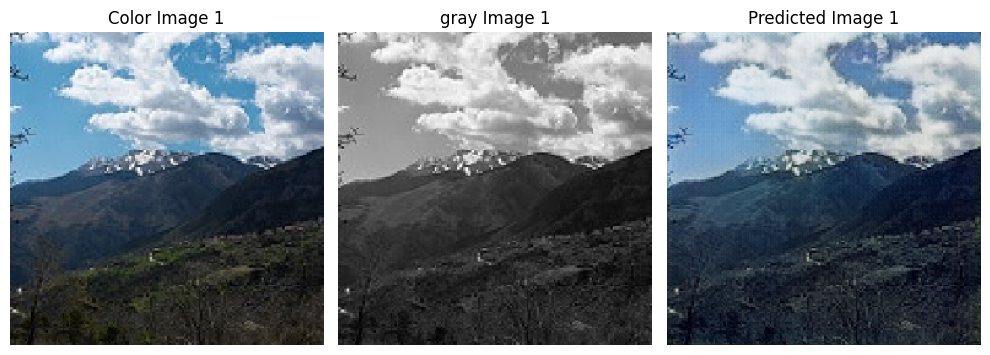

<Figure size 640x480 with 0 Axes>

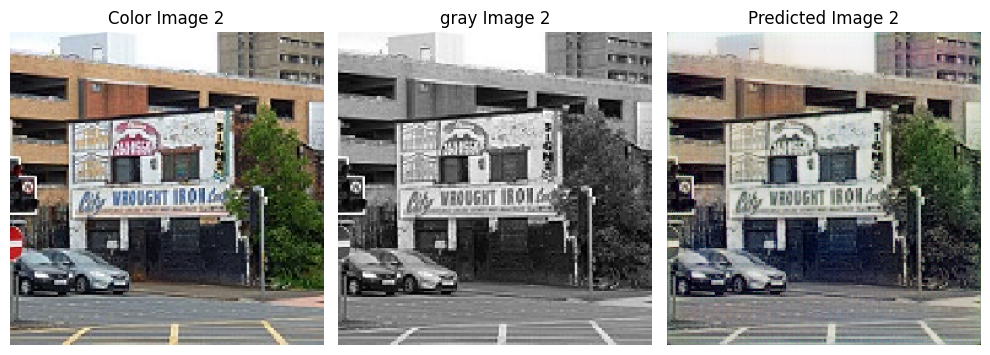

<Figure size 640x480 with 0 Axes>

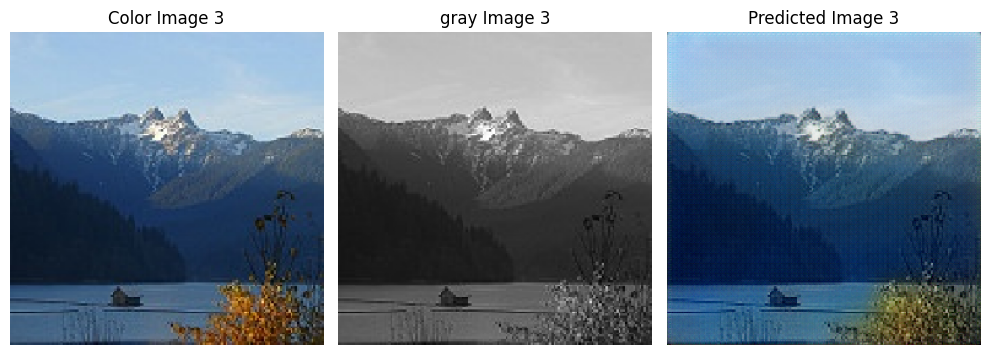

<Figure size 640x480 with 0 Axes>

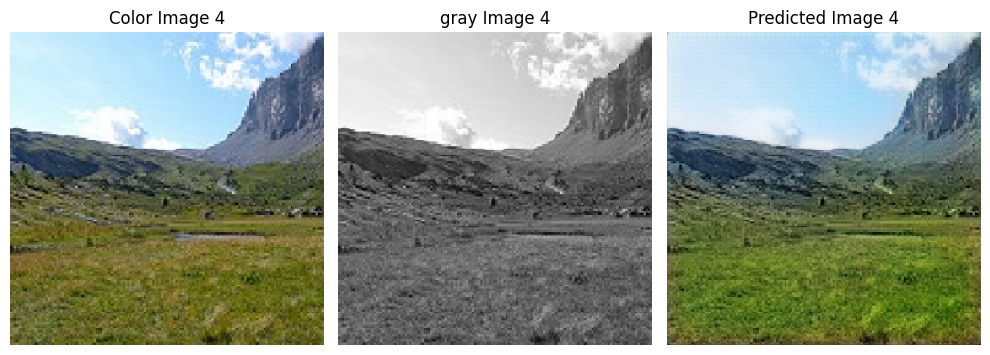

<Figure size 640x480 with 0 Axes>

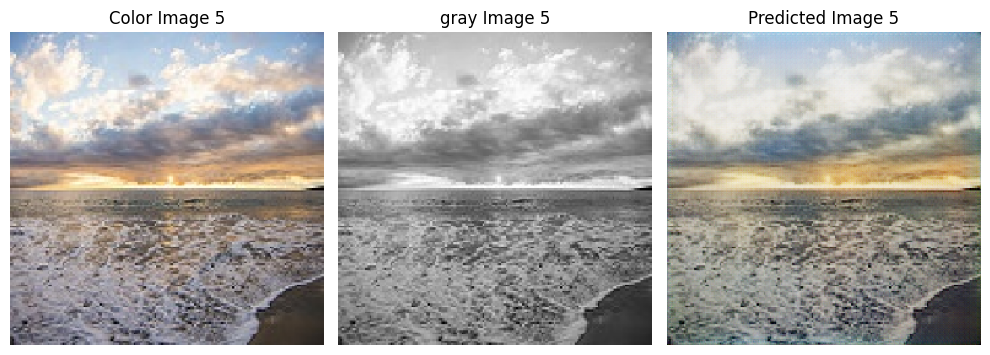

<Figure size 640x480 with 0 Axes>

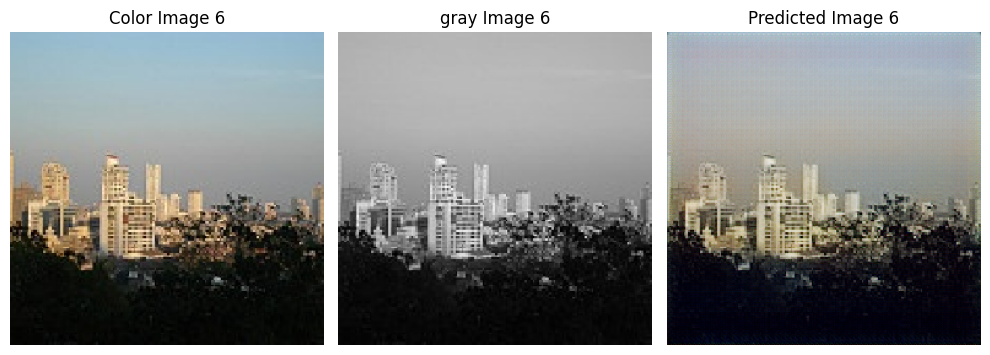

<Figure size 640x480 with 0 Axes>

In [20]:
import os
def visualize_predictions(data, num_images=6):
    """
    Visualizes input images, target images, and generated images after training.
    """
    # Create a directory to save predicted images if it doesn't exist
    folder = "predicted_images2"
    if not os.path.exists(folder):
        os.makedirs(folder)

    # Get a batch from the dataset
    for batch in data.take(2):  
        input_images, target_images = batch

    generated_images = generator(input_images, training=False)

    for i in range(min(num_images, input_images.shape[0])):  
        plt.figure(figsize=(10, 8))
        
        # Color Image (Target RGB)
        plt.subplot(1, 3, 1)
        plt.imshow(target_images[i])  # Target RGB image
        plt.title(f"Color Image {i + 1}")
        plt.axis('off')
        
        #  (Input Grayscale)
        plt.subplot(1, 3, 2)
        plt.imshow(input_images[i], cmap='gray')  
        plt.title(f"gray Image {i + 1}")
        plt.axis('off')
        
        # Predicted Image 
        plt.subplot(1, 3, 3)
        plt.imshow(generated_images[i]) 
        plt.title(f"Predicted Image {i + 1}")
        plt.axis('off')
        
        plt.subplots_adjust(wspace=0, hspace=0)  
        plt.tight_layout()
        plt.show()

        # Save the predicted image to the folder
        save_path = os.path.join(folder, f"predicted_image_{i + 1}.png")
        plt.savefig(save_path, bbox_inches='tight')

visualize_predictions(data)


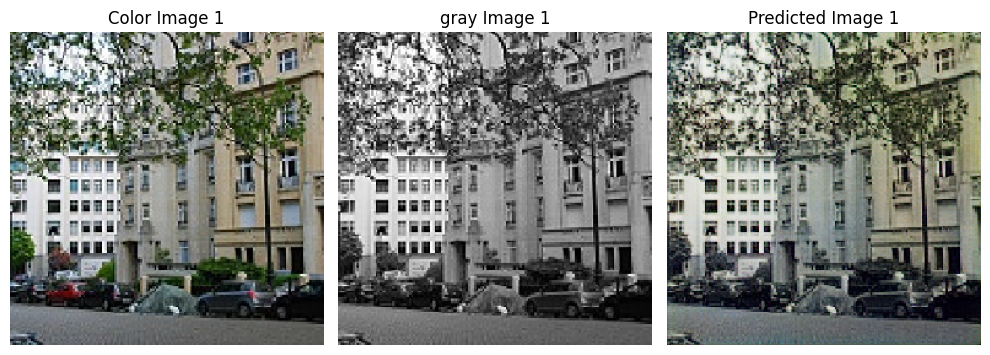

<Figure size 640x480 with 0 Axes>

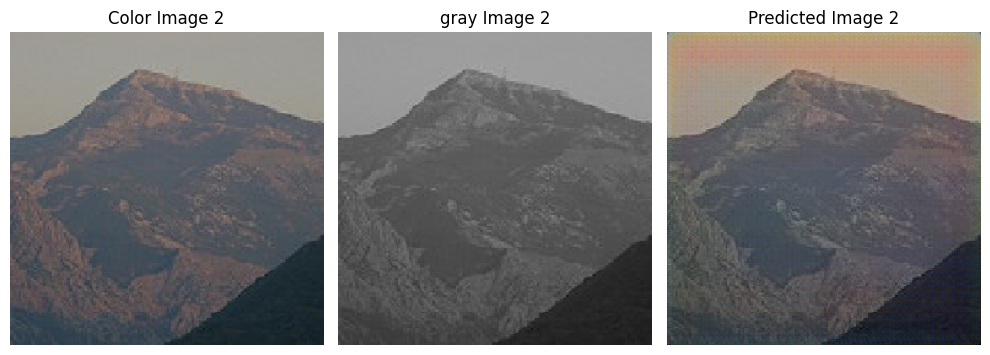

<Figure size 640x480 with 0 Axes>

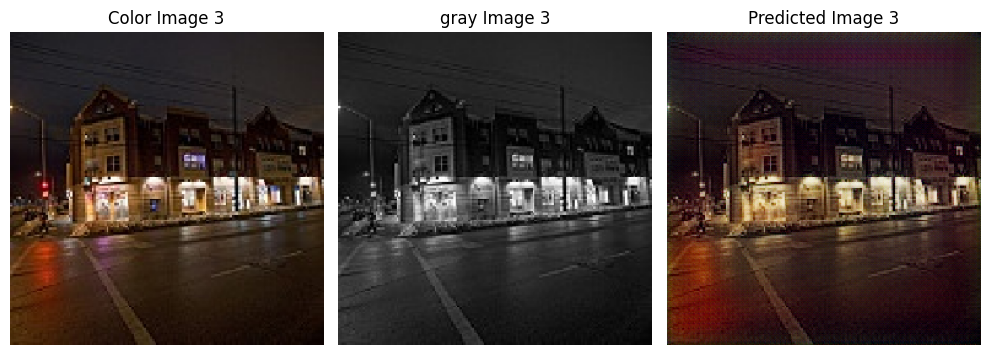

<Figure size 640x480 with 0 Axes>

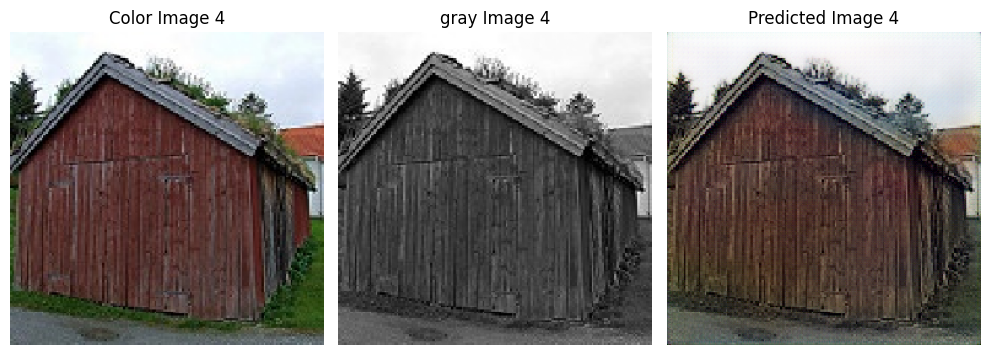

<Figure size 640x480 with 0 Axes>

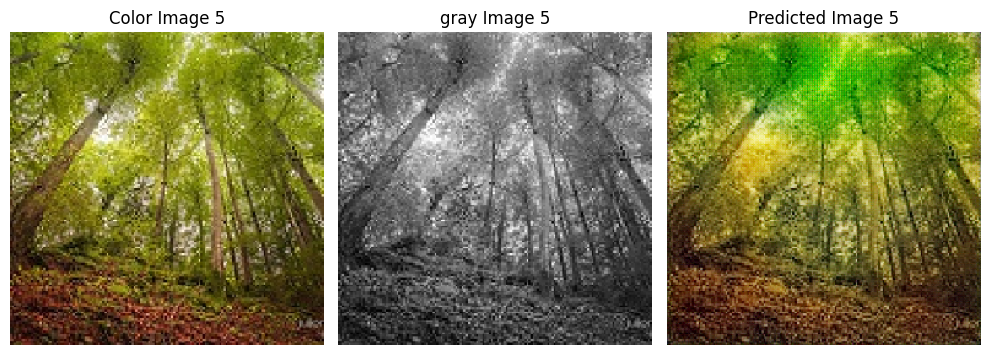

<Figure size 640x480 with 0 Axes>

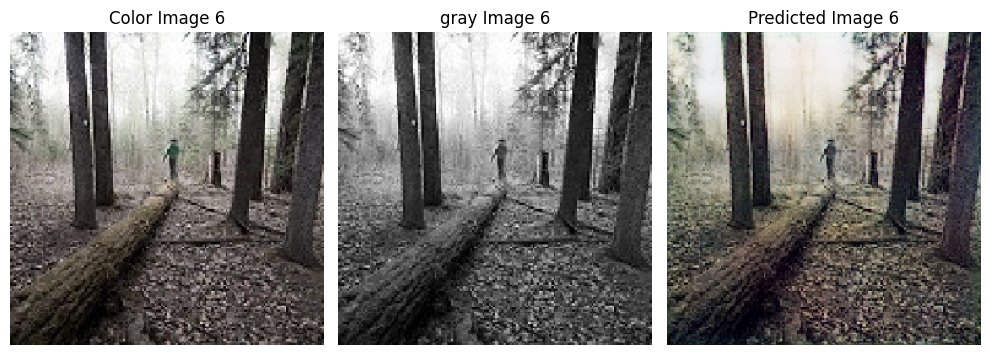

<Figure size 640x480 with 0 Axes>

In [21]:
import os
def visualize_predictions(data, num_images=6):
    """
    Visualizes input images, target images, and generated images after training.
    """
    # Create a directory to save predicted images if it doesn't exist
    folder = "predicted_images2"
    if not os.path.exists(folder):
        os.makedirs(folder)

    # Get a batch from the dataset
    for batch in data.take(3):  
        input_images, target_images = batch

    generated_images = generator(input_images, training=False)

    for i in range(min(num_images, input_images.shape[0])):  
        plt.figure(figsize=(10, 8))
        
        # Color Image (Target RGB)
        plt.subplot(1, 3, 1)
        plt.imshow(target_images[i])  # Target RGB image
        plt.title(f"Color Image {i + 1}")
        plt.axis('off')
        
        #  (Input Grayscale)
        plt.subplot(1, 3, 2)
        plt.imshow(input_images[i], cmap='gray')  
        plt.title(f"gray Image {i + 1}")
        plt.axis('off')
        
        # Predicted Image 
        plt.subplot(1, 3, 3)
        plt.imshow(generated_images[i]) 
        plt.title(f"Predicted Image {i + 1}")
        plt.axis('off')
        
        plt.subplots_adjust(wspace=0, hspace=0)  
        plt.tight_layout()
        plt.show()

        # Save the predicted image to the folder
        save_path = os.path.join(folder, f"predicted_image_{i + 1}.png")
        plt.savefig(save_path, bbox_inches='tight')

visualize_predictions(data)


# <span style="font-family:Playfair Display"> <span style="color:white;display:fill;border-radius:8px;background-color:#0B2F46;font-size:100%;font-weight: bold;color: #dbba78;font-style: italic;">Save first model </span><a id="2"></a>

In [22]:
generator.save('generator_model.h5')

In [23]:
generator = tf.keras.models.load_model('generator_model.h5')

In [24]:
import pickle

with open('modell.pkl', 'wb') as f:
    pickle.dump(generator, f)


# <span style="font-family:Playfair Display"> <span style="color:white;display:fill;border-radius:8px;background-color:#0B2F46;font-size:100%;font-weight: bold;color: #dbba78;font-style: italic;">Predict and test</span><a id="2"></a>

I0000 00:00:1729242391.954341      70 service.cc:145] XLA service 0x7c4188003330 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1729242391.954394      70 service.cc:153]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


I0000 00:00:1729242393.480291      70 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


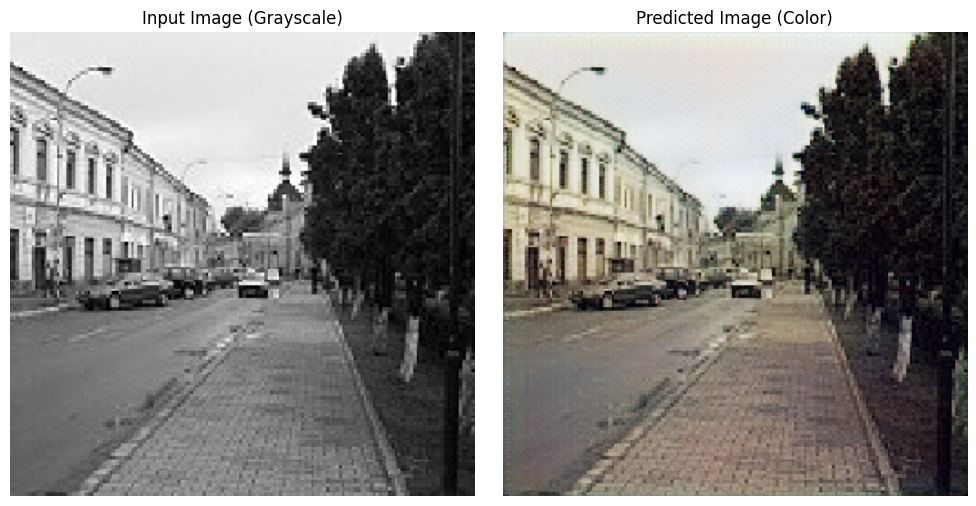

In [25]:
from keras.preprocessing.image import load_img, img_to_array
import numpy as np
import matplotlib.pyplot as plt

def preprocess_image(image_path, target_size=(256, 256)):
    """
    Load and preprocess a grayscale image, converting it to a 3-channel format.

    image_path: Path to the grayscale image.
    target_size: Target size for resizing the image.
    """
    # Load image in grayscale mode and resize
    img = load_img(image_path, target_size=target_size, color_mode="grayscale")

#Input Grayscale Image
#Convert image to array and normalize
    img_array = img_to_array(img)
    img_array = img_array / 255.0  # Normalize to [0,1]


    img_array = np.repeat(img_array, 3, axis=-1)


    img_array = np.expand_dims(img_array, axis=0)

    return img_array


image_path = '/kaggle/input/landscape-image-colorization/landscape Images/gray/1003.jpg'


new_image = preprocess_image(image_path, target_size=(256, 256))

#Input Grayscale Image
#Assuming 'generator' is a pre-trained model for prediction
predicted_image = generator.predict(new_image)


plt.figure(figsize=(10, 5))

#Input Grayscale Image
plt.subplot(1, 2, 1)
plt.imshow(new_image[0, :, :, 0], cmap='gray')  # Grayscale input
plt.title("Input Image (Grayscale)")
plt.axis('off')

#Input Grayscale Image
#Predicted Color Image
plt.subplot(1, 2, 2)
plt.imshow(predicted_image[0])  # Predicted RGB output
plt.title("Predicted Image (Color)")
plt.axis('off')

plt.tight_layout()
plt.show()

<a id="1"></a>
# <center> <span style="font-family:Georgia"> <span style="color:white;font-weight:bold"> <span style="background:#0B2F46"> 📕Style Transfer</span>
    

# <span style="color:green;">This Part demonstrates the process of neural style transfer, using image colorization as the input for enhanced artistic transformations.</span>


# <span style="font-family:Playfair Display"> <span style="color:white;display:fill;border-radius:8px;background-color:#0B2F46;font-size:100%;font-weight: bold;color: #dbba78;font-style: italic;"> Content and Style Images</span>
# Below are the two images used for the style transfer process

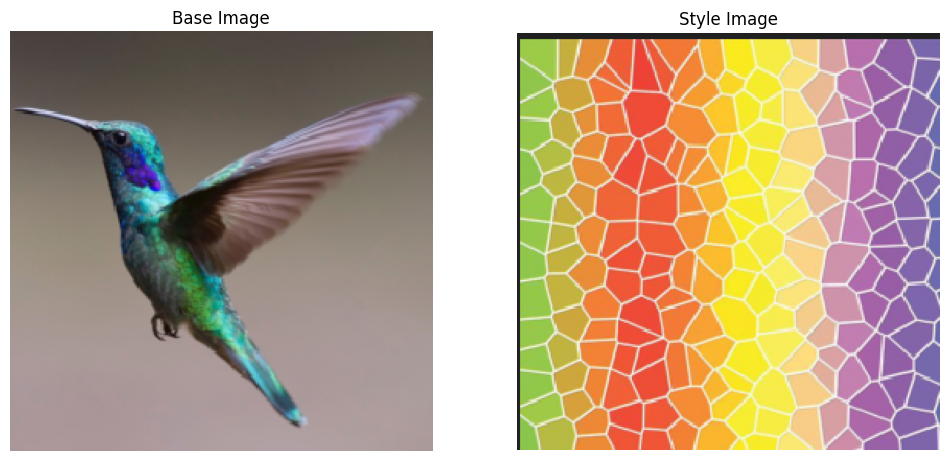

In [26]:
from PIL import Image

style_image_path = "/kaggle/input/stylee2/Screenshot 2024-10-16 222548.png"
base_image_path = "/kaggle/input/stylee2/Screenshot 2024-10-16 222618.png"

style_image = Image.open(style_image_path).convert('RGB')
base_image = Image.open(base_image_path).convert('RGB')

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(base_image)
plt.title("Base Image")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(style_image)
plt.title("Style Image")
plt.axis('off')

plt.show()

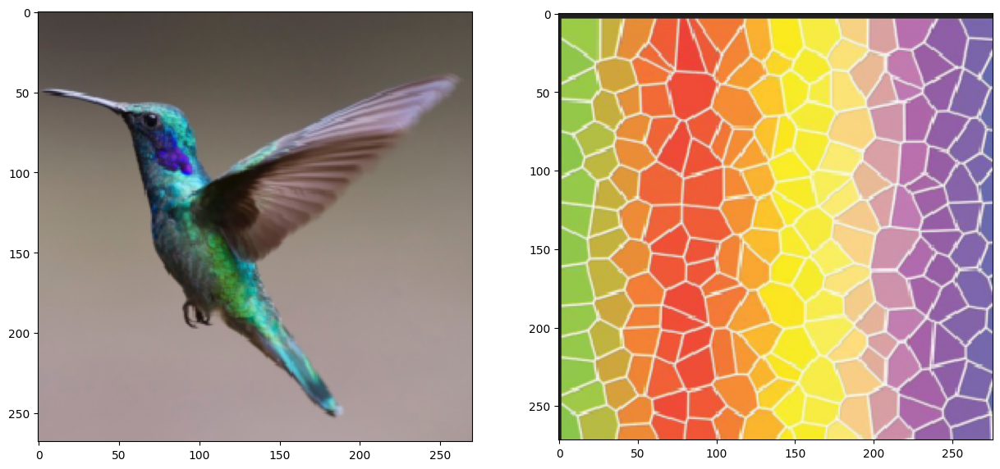

In [27]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt

a = plt.imread(base_image_path)
b = plt.imread(style_image_path)
f, axarr = plt.subplots(1,2, figsize=(15,15))
axarr[0].imshow(a)
axarr[1].imshow(b)
plt.show()


# <span style="font-family:Playfair Display"> <span style="color:white;display:fill;border-radius:8px;background-color:#0B2F46;font-size:100%;font-weight: bold;color: #dbba78;font-style: italic;">Gram Matrix</span>

In [28]:
def gram_matrix(x):
    x = tf.transpose(x, (2, 0, 1))
    features = tf.reshape(x, (tf.shape(x)[0], -1))
    gram = tf.matmul(features, tf.transpose(features))
    return gram


In [29]:
def coste_estilo(style, combination):
    S = gram_matrix(style)
    C = gram_matrix(combination)
    channels = 3
    size = img_nrows * img_ncols
    return tf.reduce_sum(tf.square(S - C)) / (4.0 * (channels ** 2) * (size ** 2))


In [30]:
def coste_contenido(base, combination):
    return tf.reduce_sum(tf.square(combination - base))


# <span style="font-family:Playfair Display"> <span style="color:white;display:fill;border-radius:8px;background-color:#0B2F46;font-size:100%;font-weight: bold;color: #dbba78;font-style: italic;">Loading the VGG19 Model</span>

In [31]:
from tensorflow.keras.applications import vgg19
from keras.utils import plot_model

model = vgg19.VGG19(weights="imagenet", include_top=False)

model.summary()


80134624/80134624 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


Model: "vgg19"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_18 (InputLayer)     │ (None, None, None, 3)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, None, None, 64) │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, None, None, 64) │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, None, None, 64) │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, None, None,     │        73,856 │
│                                 │ 128)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, None, None,     │       147,584 │
│                                 │ 128)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, None, None,     │             0 │
│                                 │ 128)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, None, None,     │       295,168 │
│                                 │ 256)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, None, None,     │       590,080 │
│                                 │ 256)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, None, None,     │       590,080 │
│                                 │ 256)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv4 (Conv2D)           │ (None, None, None,     │       590,080 │
│                                 │ 256)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, None, None,     │             0 │
│                                 │ 256)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, None, None,     │     1,180,160 │
│                                 │ 512)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, None, None,     │     2,359,808 │
│                                 │ 512)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, None, None,     │     2,359,808 │
│                                 │ 512)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv4 (Conv2D)           │ (None, None, None,     │     2,359,808 │
│                                 │ 512)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, None, None,     │             0 │
│                                 │ 512)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, None, None,     │     2,359,808 │
│                                 │ 512)                   │             

 Total params: 20,024,384 (76.39 MB)

 Trainable params: 20,024,384 (76.39 MB)

 Non-trainable params: 0 (0.00 B)

# <span style="font-family:Playfair Display"> <span style="color:white;display:fill;border-radius:8px;background-color:#0B2F46;font-size:100%;font-weight: bold;color: #dbba78;font-style: italic;">Calculation of Loss Functions</span>

In [32]:
from keras import Model

outputs_dict= dict([(layer.name, layer.output) for layer in model.layers])

feature_extractor = Model(inputs=model.inputs, outputs=outputs_dict)


In [33]:
capas_estilo = [
    "block1_conv1",
    "block2_conv1",
    "block3_conv1",
    "block4_conv1",
    "block5_conv1",]

capas_contenido = "block5_conv2"

content_weight = 2.5e-8
style_weight = 1e-6

def loss_function(combination_image, base_image, style_reference_image):

    
    input_tensor = tf.concat(
        [base_image, style_reference_image, combination_image], axis=0
    )


    features = feature_extractor(input_tensor)
    loss = tf.zeros(shape=())

    layer_features = features[capas_contenido]
    base_image_features = layer_features[0, :, :, :]
    combination_features = layer_features[2, :, :, :]

    loss = loss + content_weight * coste_contenido(
        base_image_features, combination_features
    )
    
    for layer_name in capas_estilo:
        layer_features = features[layer_name]
        style_reference_features = layer_features[1, :, :, :]
        combination_features = layer_features[2, :, :, :]
        sl = coste_estilo(style_reference_features, combination_features)
        loss += (style_weight / len(capas_estilo)) * sl

    return loss


# <span style="font-family:Playfair Display"> <span style="color:white;display:fill;border-radius:8px;background-color:#0B2F46;font-size:100%;font-weight: bold;color: #dbba78;font-style: italic;">Learning of the Style Transfer</span>

In [34]:
import tensorflow as tf

@tf.function
def compute_loss_and_grads(combination_image, base_image, style_reference_image):
    with tf.GradientTape() as tape:
        loss = loss_function(combination_image, base_image, style_reference_image)
    grads = tape.gradient(loss, combination_image)
    return loss, grads


# <span style="font-family:Playfair Display"> <span style="color:white;display:fill;border-radius:8px;background-color:#0B2F46;font-size:100%;font-weight: bold;color: #dbba78;font-style: italic;">Preprocess and Deprocess Images</span>

In [35]:
import keras
from tensorflow.keras.applications import vgg19
import numpy as np


def preprocess_image(image_path):
    
    img = keras.preprocessing.image.load_img(
        image_path, target_size=(img_nrows, img_ncols)
    )
    img = keras.preprocessing.image.img_to_array(img)
    img = np.expand_dims(img, axis=0)
    img = vgg19.preprocess_input(img)
    return tf.convert_to_tensor(img)


In [36]:
def deprocess_image(x):

    # Convertimos el tensor en Array
    x = x.reshape((img_nrows, img_ncols, 3))

    # Hacemos que no tengan promedio 0
    x[:, :, 0] += 103.939
    x[:, :, 1] += 116.779
    x[:, :, 2] += 123.68

    # Convertimos de BGR a RGB.
    x = x[:, :, ::-1]

    # Nos aseguramos que están entre 0 y 255
    x = np.clip(x, 0, 255).astype("uint8")

    return x


In [37]:
from datetime import datetime

def result_saver(iteration):
  # Create name
  now = datetime.now()
  now = now.strftime("%Y%m%d_%H%M%S")
  #model_name = str(i) + '_' + str(now)+"_model_" + '.h5'
  image_name = str(i) + '_' + str(now)+"_image" + '.png'

  # Save image
  img = deprocess_image(combination_image.numpy())
  keras.preprocessing.image.save_img(image_name, img)


# <span style="font-family:Playfair Display"> <span style="color:white;display:fill;border-radius:8px;background-color:#0B2F46;font-size:100%;font-weight: bold;color: #dbba78;font-style: italic;">Training</span>

In [38]:
from keras.optimizers import SGD

width, height = keras.preprocessing.image.load_img(base_image_path).size
img_nrows = 400
img_ncols = int(width * img_nrows / height)

optimizer = SGD(
    keras.optimizers.schedules.ExponentialDecay(
        initial_learning_rate=300.0, decay_steps=100, decay_rate=0.96
    )
)

base_image = preprocess_image(base_image_path)
style_reference_image = preprocess_image(style_image_path)
combination_image = tf.Variable(preprocess_image(base_image_path))

iterations = 4000

for i in range(1, iterations + 1):
    loss, grads = compute_loss_and_grads(
        combination_image, base_image, style_reference_image
    )
    optimizer.apply_gradients([(grads, combination_image)])
    if i % 10 == 0:
        print("Iteration %d: loss=%.2f" % (i, loss))
        result_saver(i)


Iteration 10: loss=130452.85
Iteration 20: loss=27540.69
Iteration 30: loss=19105.20
Iteration 40: loss=25728.00
Iteration 50: loss=23844.33
Iteration 60: loss=61641.04
Iteration 70: loss=19485.49
Iteration 80: loss=17520.85
Iteration 90: loss=18419.46
Iteration 100: loss=18499.52
Iteration 110: loss=15975.74
Iteration 120: loss=14831.89
Iteration 130: loss=12002.30
Iteration 140: loss=36051.70
Iteration 150: loss=22293.81
Iteration 160: loss=19100.82
Iteration 170: loss=19240.73
Iteration 180: loss=15399.21
Iteration 190: loss=20254.30
Iteration 200: loss=13201.39
Iteration 210: loss=21461.52
Iteration 220: loss=19270.76
Iteration 230: loss=12160.41
Iteration 240: loss=16174.35
Iteration 250: loss=9516.50
Iteration 260: loss=14356.93
Iteration 270: loss=9890.87
Iteration 280: loss=18498.07
Iteration 290: loss=11094.40
Iteration 300: loss=13500.19
Iteration 310: loss=24176.57
Iteration 320: loss=10188.28
Iteration 330: loss=8755.77
Iteration 340: loss=5569.76
Iteration 350: loss=15571.

# <span style="font-family:Playfair Display"> <span style="color:white;display:fill;border-radius:8px;background-color:#0B2F46;font-size:100%;font-weight: bold;color: #dbba78;font-style: italic;">Final image</span>

In [39]:
final_image = combination_image.numpy()
final_image = deprocess_image(final_image)

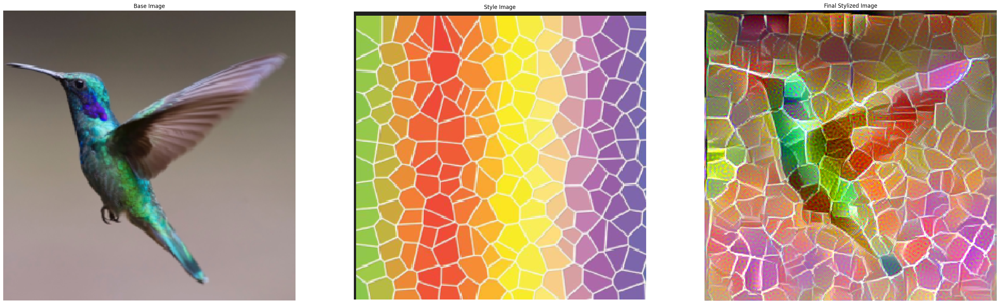

In [40]:
style_image_path = "/kaggle/input/stylee2/Screenshot 2024-10-16 222548.png"
base_image_path = "/kaggle/input/stylee2/Screenshot 2024-10-16 222618.png"


style_image = Image.open(style_image_path).convert('RGB')
base_image = Image.open(base_image_path).convert('RGB')

plt.figure(figsize=(40,40))
plt.subplot(1, 3, 1)
plt.imshow(base_image)
plt.title("Base Image")
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(style_image)
plt.title("Style Image")
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(final_image)
plt.title('Final Stylized Image')
plt.axis('off')

plt.show()


In [41]:
import pickle

model_data = {
    'combination_image': combination_image.numpy(),
    'base_image': base_image,
    'style_reference_image': style_reference_image
}

with open('/kaggle/working/model_data23.pkl', 'wb') as f:
    pickle.dump(model_data, f)

print("Model saved successfully.")


Model saved successfully.
